# Naive Bayes algorithm
- **In machine learning, Naïve Bayes classification is a straightforward and powerful algorithm for the classification task**.
- Naïve Bayes classification is based on applying Bayes’ theorem with strong independence assumption between the features. 
- Naïve Bayes classification produces good results when we use it for textual data analysis such as Natural Language Processing.
- Naïve Bayes models are also known as `simple Bayes or independent Bayes`. 
- All these names refer to the application of Bayes’ theorem in the classifier’s decision rule.
- Naïve Bayes classifier applies the Bayes’ theorem in practice. This classifier brings the power of Bayes’ theorem to machine learning.

## Gaussian Naive Bayes algorithm
- When we have continuous attribute values, we made an assumption that the values associated with each class are distributed according to Gaussian or Normal distribution.
- For example, suppose the training data contains a continuous attribute x. We first segment the data by the class, and then compute the mean and variance of x in each class. Let µi be the mean of the values and let σi be the variance of the values associated with the ith class.

# Prepare a classification model using Naive Bayes for salary data 

#### Data Description:

- age -- age of a person
- workclass	-- A work class is a grouping of work 
- education	-- Education of an individuals	
- maritalstatus -- Marital status of an individulas	
- occupation	 -- occupation of an individuals
- relationship -- 	
- race --  Race of an Individual
- sex --  Gender of an Individual
- capitalgain --  profit received from the sale of an investment	
- capitalloss	-- A decrease in the value of a capital asset
- hoursperweek -- number of hours work per week	
- native -- Native of an individual
- Salary -- salary of an individual

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sn
import scipy.stats as st
import statsmodels.api as sm

from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler,LabelEncoder
from sklearn.model_selection import train_test_split

from sklearn.naive_bayes import MultinomialNB,GaussianNB,CategoricalNB
from imblearn.over_sampling import SMOTE,  ADASYN

from sklearn.metrics import classification_report,confusion_matrix,accuracy_score,roc_auc_score,roc_curve,precision_score

import dataprep.eda


import warnings 
warnings.filterwarnings('ignore')

In [2]:
# Importing training dataset
train=pd.read_excel('SalaryData_Train.xlsx')
train

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,39,State-gov,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174.0,0.0,40.0,United-States,<=50K
1,50,Self-emp-not-inc,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0.0,0.0,13.0,United-States,<=50K
2,38,Private,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0.0,0.0,40.0,United-States,<=50K
3,53,Private,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0.0,0.0,40.0,United-States,<=50K
4,28,Private,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0.0,0.0,40.0,Cuba,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27279,32,Private,HS-grad,9,Divorced,Adm-clerical,Own-child,White,Female,0.0,0.0,40.0,United-States,<=50K
27280,61,Private,Some-college,10,Divorced,Sales,Not-in-family,White,Female,0.0,0.0,40.0,United-States,<=50K
27281,21,Private,1st-4th,2,Married-civ-spouse,Other-service,Other-relative,White,Male,0.0,0.0,40.0,England,<=50K
27282,56,Private,11th,7,Divorced,Craft-repair,Not-in-family,White,Male,0.0,0.0,49.0,United-States,<=50K


In [3]:
#imortin test data
test=pd.read_csv('SalaryData_Test.csv')
test

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,25,Private,11th,7,Never-married,Machine-op-inspct,Own-child,Black,Male,0,0,40,United-States,<=50K
1,38,Private,HS-grad,9,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,50,United-States,<=50K
2,28,Local-gov,Assoc-acdm,12,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,40,United-States,>50K
3,44,Private,Some-college,10,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,7688,0,40,United-States,>50K
4,34,Private,10th,6,Never-married,Other-service,Not-in-family,White,Male,0,0,30,United-States,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15055,33,Private,Bachelors,13,Never-married,Prof-specialty,Own-child,White,Male,0,0,40,United-States,<=50K
15056,39,Private,Bachelors,13,Divorced,Prof-specialty,Not-in-family,White,Female,0,0,36,United-States,<=50K
15057,38,Private,Bachelors,13,Married-civ-spouse,Prof-specialty,Husband,White,Male,0,0,50,United-States,<=50K
15058,44,Private,Bachelors,13,Divorced,Adm-clerical,Own-child,Asian-Pac-Islander,Male,5455,0,40,United-States,<=50K


In [4]:
data=train.append(test)
data.reset_index(inplace=True,drop=True)
data

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,39,State-gov,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174.0,0.0,40.0,United-States,<=50K
1,50,Self-emp-not-inc,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0.0,0.0,13.0,United-States,<=50K
2,38,Private,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0.0,0.0,40.0,United-States,<=50K
3,53,Private,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0.0,0.0,40.0,United-States,<=50K
4,28,Private,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0.0,0.0,40.0,Cuba,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42339,33,Private,Bachelors,13,Never-married,Prof-specialty,Own-child,White,Male,0.0,0.0,40.0,United-States,<=50K
42340,39,Private,Bachelors,13,Divorced,Prof-specialty,Not-in-family,White,Female,0.0,0.0,36.0,United-States,<=50K
42341,38,Private,Bachelors,13,Married-civ-spouse,Prof-specialty,Husband,White,Male,0.0,0.0,50.0,United-States,<=50K
42342,44,Private,Bachelors,13,Divorced,Adm-clerical,Own-child,Asian-Pac-Islander,Male,5455.0,0.0,40.0,United-States,<=50K


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42344 entries, 0 to 42343
Data columns (total 14 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   age            42344 non-null  int64  
 1   workclass      42344 non-null  object 
 2   education      42344 non-null  object 
 3   educationno    42344 non-null  int64  
 4   maritalstatus  42344 non-null  object 
 5   occupation     42343 non-null  object 
 6   relationship   42343 non-null  object 
 7   race           42343 non-null  object 
 8   sex            42343 non-null  object 
 9   capitalgain    42343 non-null  float64
 10  capitalloss    42343 non-null  float64
 11  hoursperweek   42343 non-null  float64
 12  native         42343 non-null  object 
 13  Salary         42343 non-null  object 
dtypes: float64(3), int64(2), object(9)
memory usage: 4.5+ MB


In [6]:
data.describe()

,age,educationno,capitalgain,capitalloss,hoursperweek
count,42344.000000,42344.000000,42343.000000,42343.000000,42343.000000
mean,38.564047,10.113948,1110.258602,87.830055,40.926222
std,13.242745,2.552748,7576.006868,403.467604,11.982932
min,17.000000,1.000000,0.000000,0.000000,1.000000
25%,28.000000,9.000000,0.000000,0.000000,40.000000
50%,37.000000,10.000000,0.000000,0.000000,40.000000
75%,47.000000,13.000000,0.000000,0.000000,45.000000
max,90.000000,16.000000,99999.000000,4356.000000,99.000000


In [7]:
data.isna().sum()

age              0
workclass        0
education        0
educationno      0
maritalstatus    0
occupation       1
relationship     1
race             1
sex              1
capitalgain      1
capitalloss      1
hoursperweek     1
native           1
Salary           1
dtype: int64

In the data there are some null values.

In [8]:
# We drop the na values
data.dropna(axis=0,inplace=True)

In [9]:
data.isna().sum()

age              0
workclass        0
education        0
educationno      0
maritalstatus    0
occupation       0
relationship     0
race             0
sex              0
capitalgain      0
capitalloss      0
hoursperweek     0
native           0
Salary           0
dtype: int64

In [10]:
data[data.duplicated()]

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
326,33,Private,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0.0,0.0,40.0,United-States,>50K
364,27,Private,Bachelors,13,Never-married,Craft-repair,Not-in-family,White,Male,0.0,0.0,50.0,United-States,<=50K
518,24,Private,HS-grad,9,Never-married,Handlers-cleaners,Unmarried,Black,Female,0.0,0.0,40.0,United-States,<=50K
525,24,Private,HS-grad,9,Never-married,Craft-repair,Own-child,White,Male,0.0,0.0,40.0,United-States,<=50K
619,33,Private,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0.0,0.0,40.0,United-States,>50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42328,22,Private,Some-college,10,Never-married,Craft-repair,Own-child,White,Male,0.0,0.0,40.0,United-States,<=50K
42333,32,Private,HS-grad,9,Married-civ-spouse,Handlers-cleaners,Husband,White,Male,0.0,0.0,40.0,United-States,<=50K
42336,31,Private,HS-grad,9,Married-civ-spouse,Craft-repair,Husband,White,Male,0.0,0.0,40.0,United-States,<=50K
42337,25,Private,HS-grad,9,Never-married,Other-service,Own-child,White,Female,0.0,0.0,40.0,United-States,<=50K


 No duplicate value in the data.

### Make a list of categorical and numerical columns

In [11]:
cat_features=data.describe(include='object').columns
cat_features

Index(['workclass', 'education', 'maritalstatus', 'occupation', 'relationship',
       'race', 'sex', 'native', 'Salary'],
      dtype='object')

In [12]:
num_features=data.describe(include=['int64','float64']).columns
num_features

Index(['age', 'educationno', 'capitalgain', 'capitalloss', 'hoursperweek'], dtype='object')

As we can see in the above result
- 9 categorical columns
- 5 numerical columns

In [13]:
# Now we see the unique value of categorical columns

for i in cat_features:
    unique=data[i].value_counts()
    print(unique)
    print('________________________________________________________________________________  ')

 Private             31163
 Self-emp-not-inc     3575
 Local-gov            2900
 State-gov            1814
 Self-emp-inc         1553
 Federal-gov          1318
 Without-pay            20
Name: workclass, dtype: int64
________________________________________________________________________________  
 HS-grad         13886
 Some-college     9255
 Bachelors        7101
 Masters          2344
 Assoc-voc        1818
 11th             1521
 Assoc-acdm       1395
 10th             1145
 7th-8th           781
 Prof-school       724
 9th               633
 12th              534
 Doctorate         511
 5th-6th           428
 1st-4th           200
 Preschool          67
Name: education, dtype: int64
________________________________________________________________________________  
 Married-civ-spouse       19677
 Never-married            13684
 Divorced                  5894
 Separated                 1332
 Widowed                   1208
 Married-spouse-absent      518
 Married-AF-spouse       

### Number of labels: cardinality
- The number of labels within a categorical variable is known as **cardinality**. 
- A high number of labels within a variable is known as **high cardinality**. 
- High cardinality may pose some serious problems in the machine learning model. 

In [14]:
for i in cat_features:
    print(i,'contains',len(data[i].unique()),'categories.')

workclass contains 7 categories.
education contains 16 categories.
maritalstatus contains 7 categories.
occupation contains 14 categories.
relationship contains 6 categories.
race contains 5 categories.
sex contains 2 categories.
native contains 40 categories.
Salary contains 2 categories.


From the above result,We can see that **Native=40** contain high cardinality.

# Exploratory Data analysis

In [15]:
data.corr()

,age,educationno,capitalgain,capitalloss,hoursperweek
age,1.000000,0.036607,0.079761,0.058434,0.100079
educationno,0.036607,1.000000,0.127537,0.081523,0.145283
capitalgain,0.079761,0.127537,1.000000,-0.031903,0.084216
capitalloss,0.058434,0.081523,-0.031903,1.000000,0.055450
hoursperweek,0.100079,0.145283,0.084216,0.055450,1.000000


<AxesSubplot: >

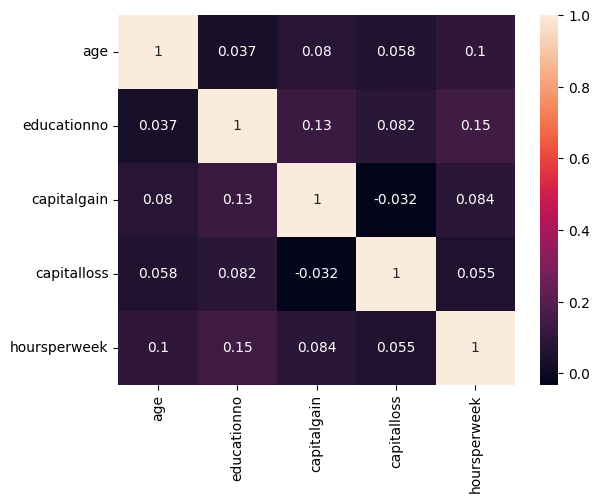

In [16]:
sn.heatmap(data.corr(),annot=True)

The Heatmap(corr)  does not reveal any clear relationship between age, education, capitalgain, capitalloss and Hoursperweek.

## Outlier Detection

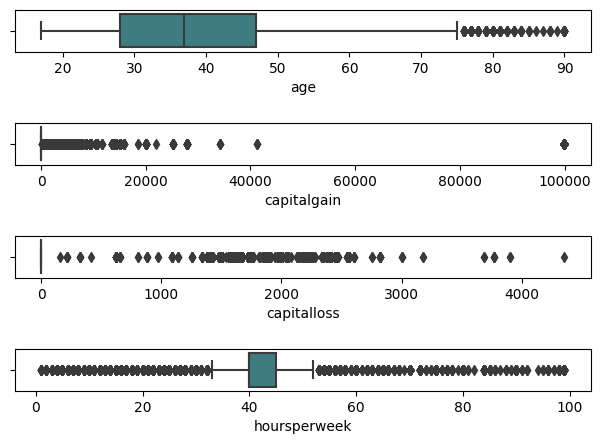

In [17]:
ot=data.copy() 
fig, axes=plt.subplots(4,1)
sn.boxplot(x='age',data=ot,palette='crest',ax=axes[0])
sn.boxplot(x='capitalgain',data=ot,palette='crest',ax=axes[1])
sn.boxplot(x='capitalloss',data=ot,palette='crest',ax=axes[2])
sn.boxplot(x='hoursperweek',data=ot,palette='crest',ax=axes[3])
plt.tight_layout(pad=2.0)


There are lot of outliers present in the dataframe but we can't drop them because they are present in a very large quantity and can be important for model building.
- So we transform using transformation after visualisation.


# Data Visualisation

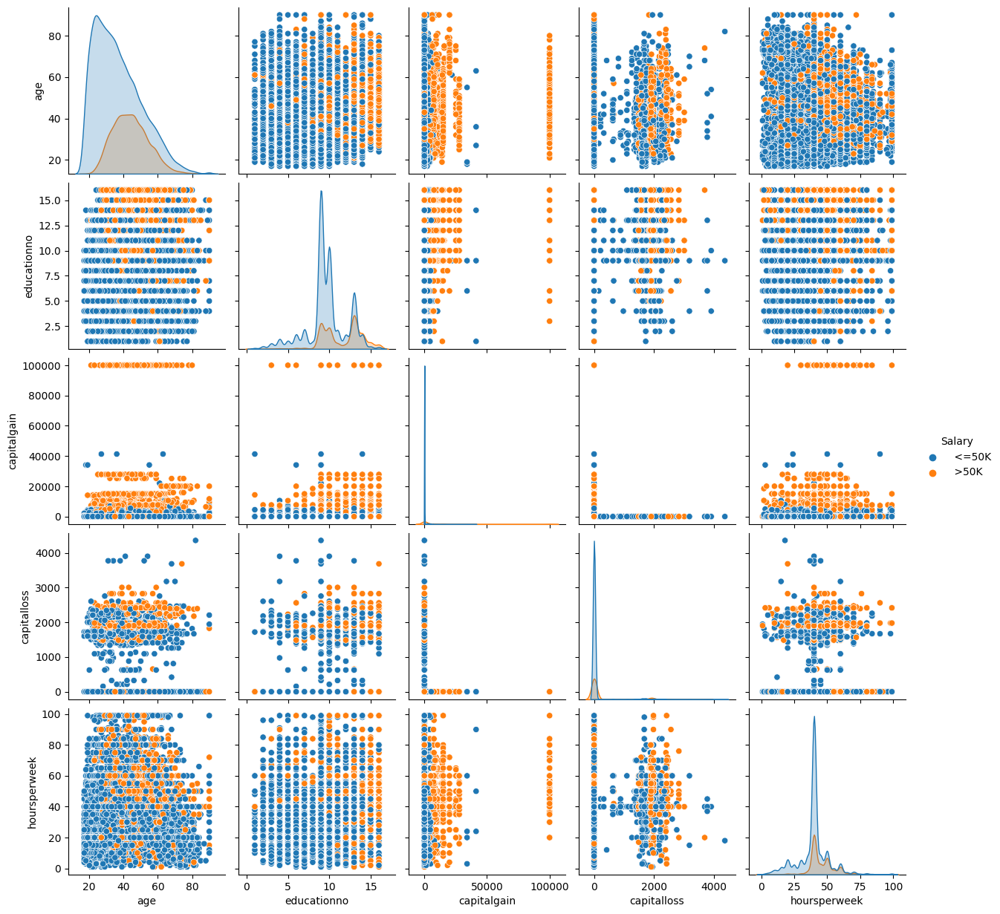

In [18]:
sn.pairplot(data,hue='Salary')

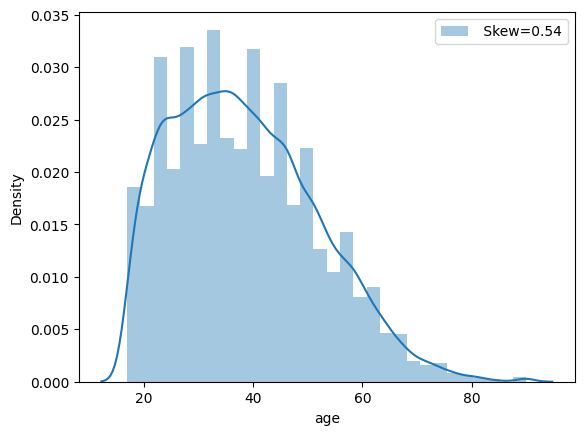

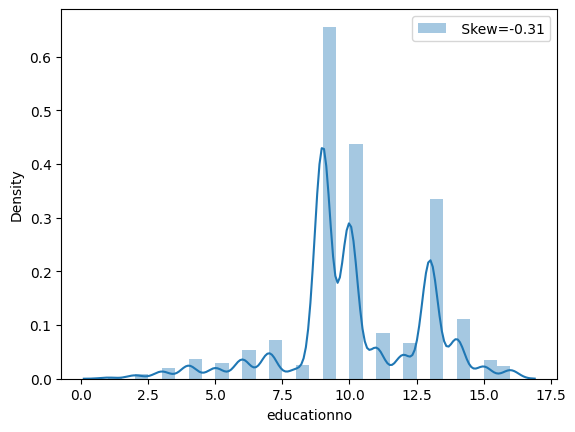

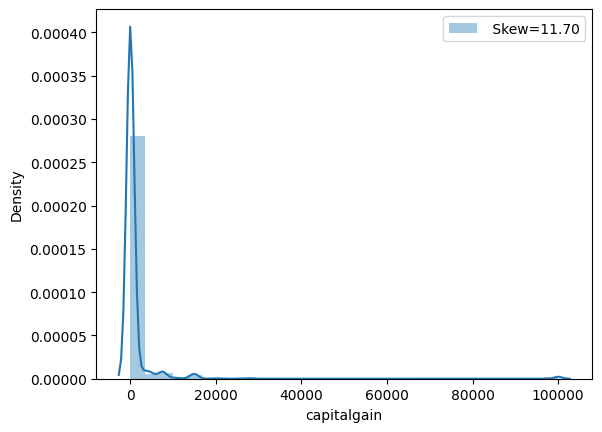

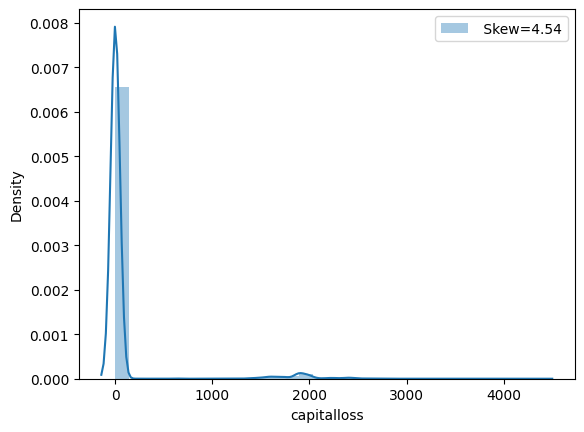

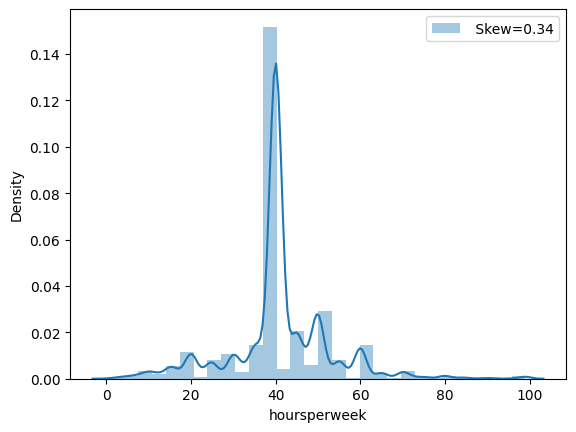

In [19]:
 # Numerical columns
for i in num_features:
    skew=data[i].skew()
    sn.distplot(data[i],kde=True,label=' Skew=%.2f'%(skew),bins=30)
    plt.legend(loc='best')
    plt.show()

From the above plots we say that the data is not normally distributed.
- We have to transform data to make normal distribution.


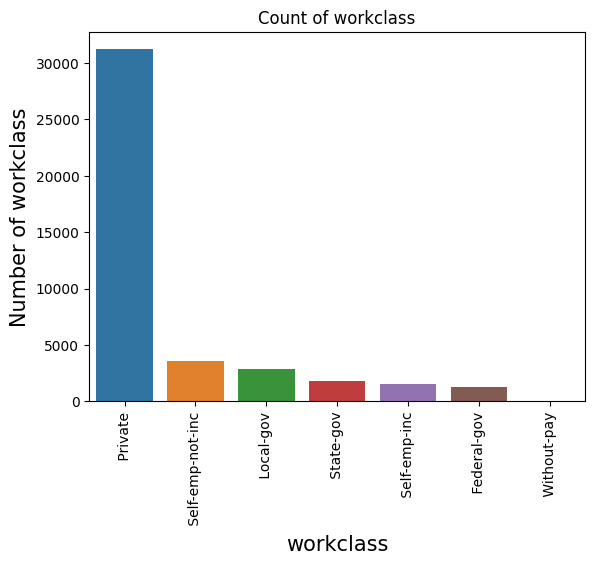

-------------------------------------------------------------------------------------------


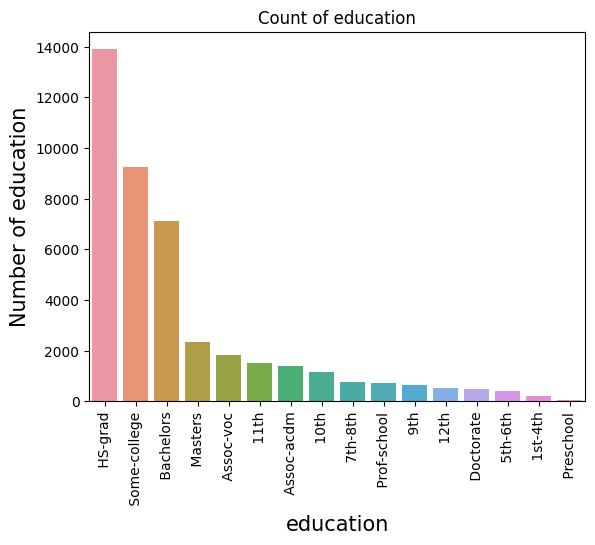

-------------------------------------------------------------------------------------------


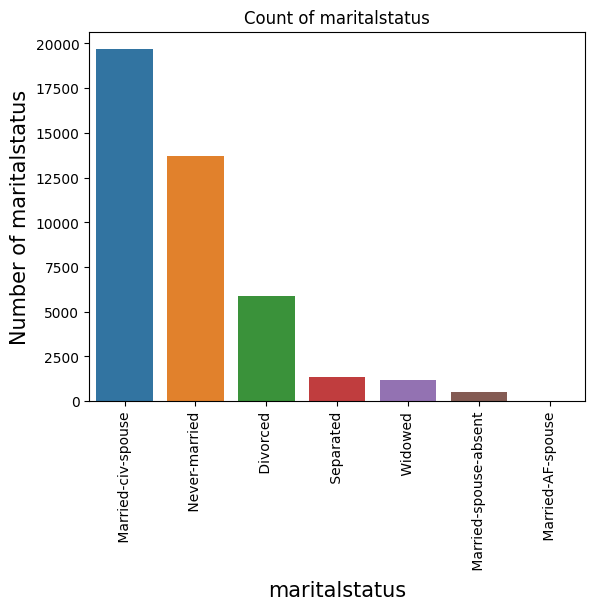

-------------------------------------------------------------------------------------------


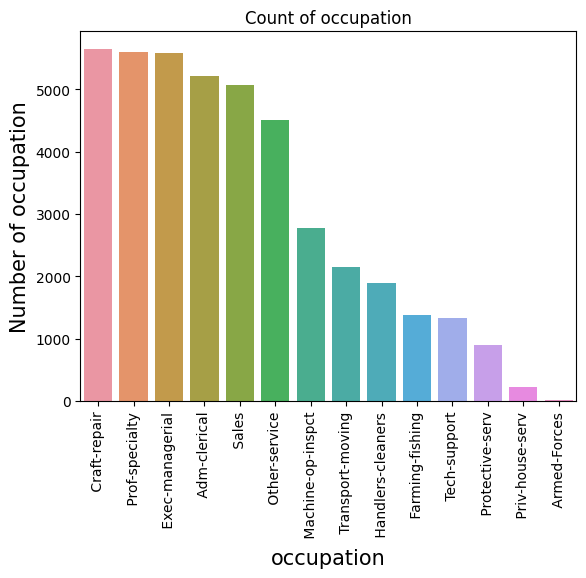

-------------------------------------------------------------------------------------------


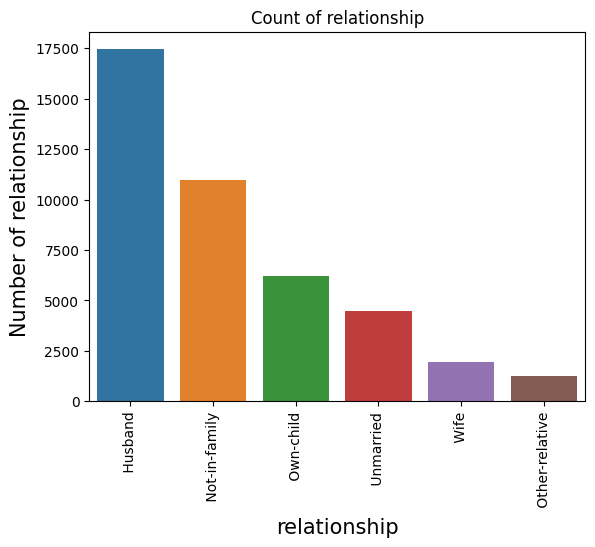

-------------------------------------------------------------------------------------------


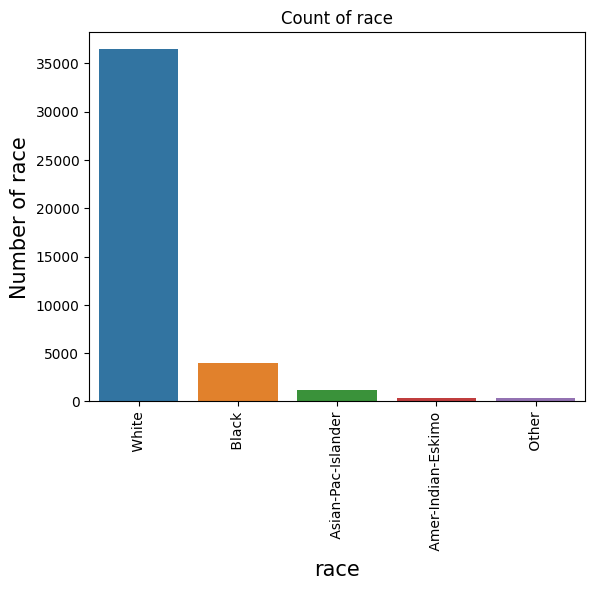

-------------------------------------------------------------------------------------------


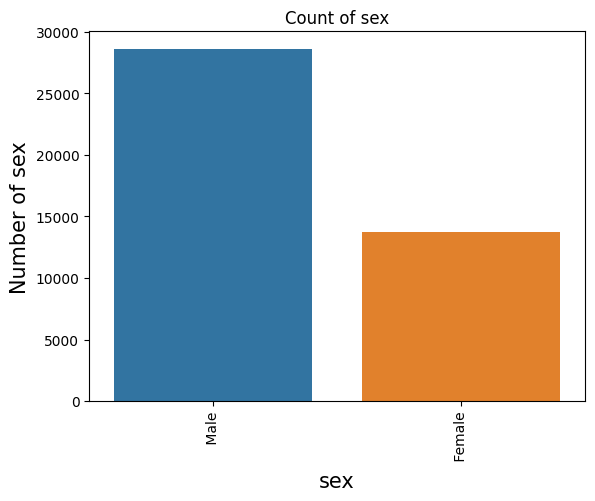

-------------------------------------------------------------------------------------------


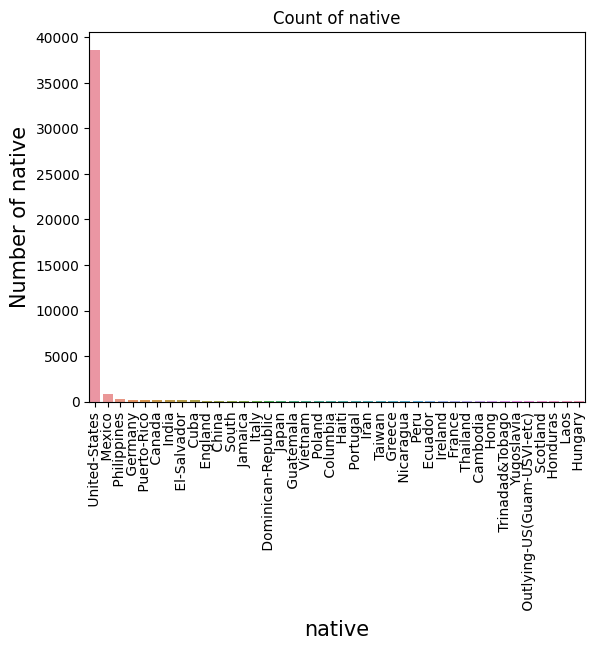

-------------------------------------------------------------------------------------------


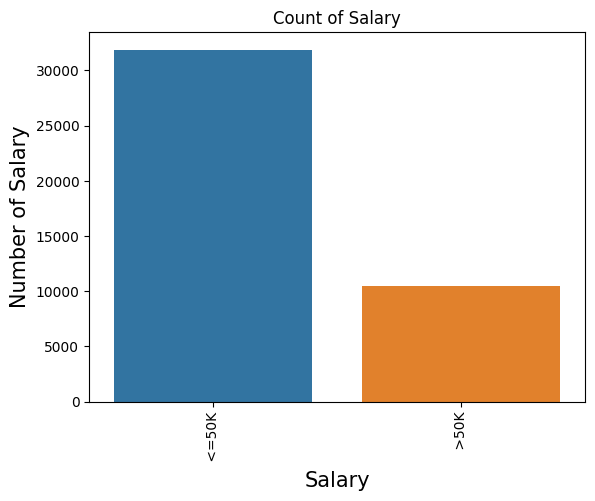

-------------------------------------------------------------------------------------------


In [20]:
# For categorical features

for i,column in enumerate (cat_features):
    unique=data[column].value_counts()
    plt.title('Count of ' + column)
    ax=sn.countplot(data=data,x=column,order=data[column].value_counts().index,);
    plt.xlabel(column,fontsize=15)
    plt.xticks(rotation=90)
    plt.ylabel('Number of '+ column,fontsize=15)
    plt.show()
    print('-------------------------------------------------------------------------------------------')

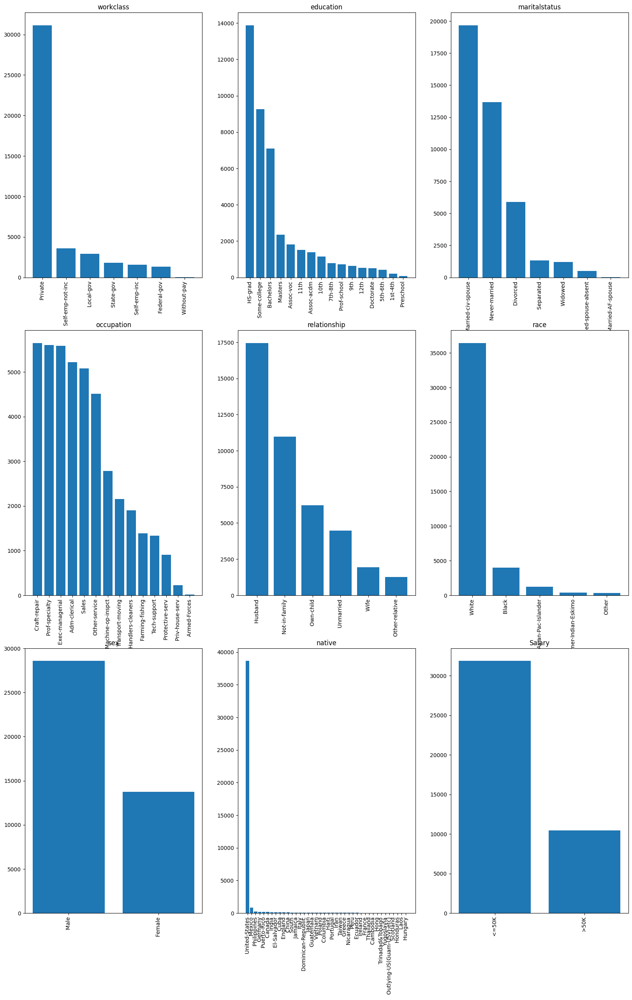

In [21]:
fig, axs = plt.subplots(3,3, sharex=False, sharey=False, figsize=(20,30))

counter = 0
for cat_column in cat_features:
    value_counts = data[cat_column].value_counts()
    
    trace_x = counter // 3
    trace_y = counter % 3
    x_pos = np.arange(0, len(value_counts))
    
    axs[trace_x, trace_y].bar(x_pos, value_counts.values, tick_label = value_counts.index)
    
    axs[trace_x, trace_y].set_title(cat_column)
    
    for tick in axs[trace_x, trace_y].get_xticklabels():
        tick.set_rotation(90)
    
    counter += 1
    
plt.show()

From the above plots we see that the 
- In Work class column Private has more values.
- In Marital status column 'Married-civ-spouse'have more salary than others
- In Education ,'HS-Grad'have more salary than others
- In Relationship.'Husband' have more salary than others.
- IN Sex,'Male' dominated female by nearly 50%
- By native, more than 95% people are belong to USA

# Our Target varibale is Salary
So we analyse the data of salary column.

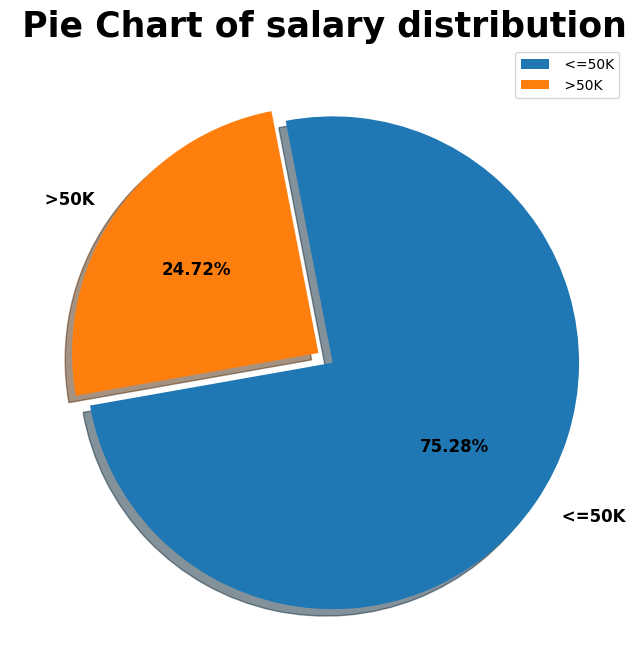

In [22]:
plt.figure(figsize = (12,8))
plt.pie(data['Salary'].value_counts(),
       labels=data.Salary.unique(),
       explode = [0.07,0.0],
       autopct= '%.2f%%',
       shadow= True,
       startangle= 190,
       textprops = {'size':'large',
                   'fontweight':'bold',
                   'color':'black'})
plt.legend(loc= 'best')
plt.title(" Pie Chart of salary distribution", fontsize =25, fontweight = 'bold')
plt.show()

As we can see in pie plot the data is heavily (75 vs 25)imbalnced which result in biased prediction by model.
- So first we chek the accuracy with this data and 
- then we use SMOTE technique to balanced the data and check the accuracy of that model.

**Before that we check therelation between salary and other columns.**

 ### Now let's look how numerical columns  with Salary.
 
- **By Statistics**
 

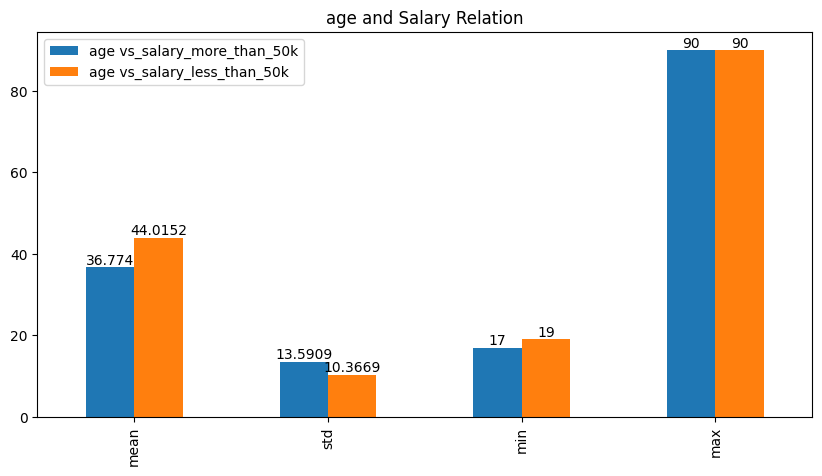

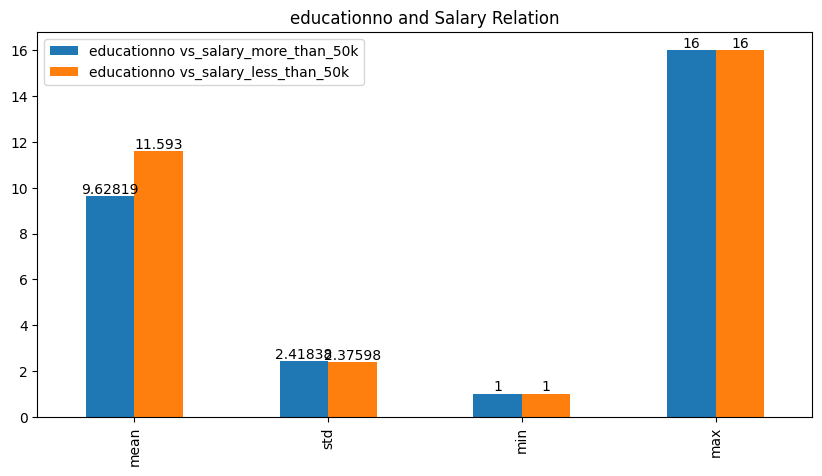

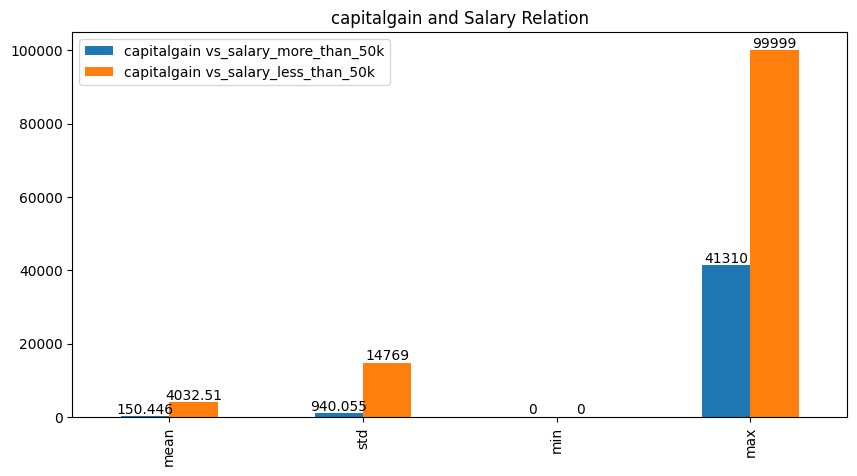

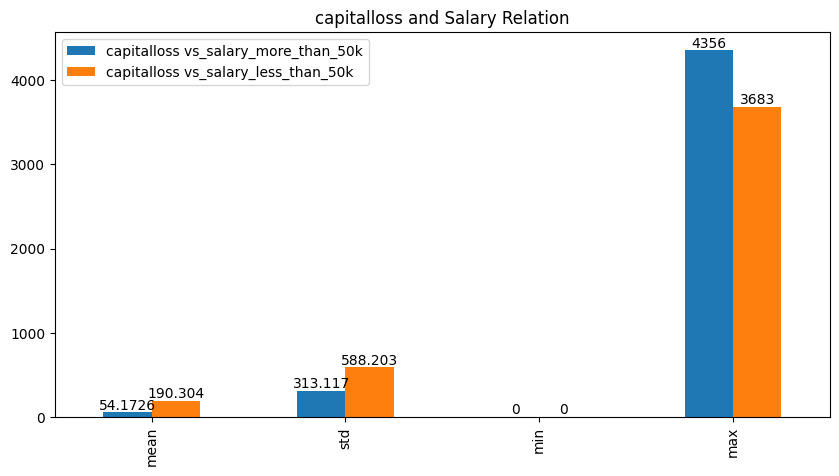

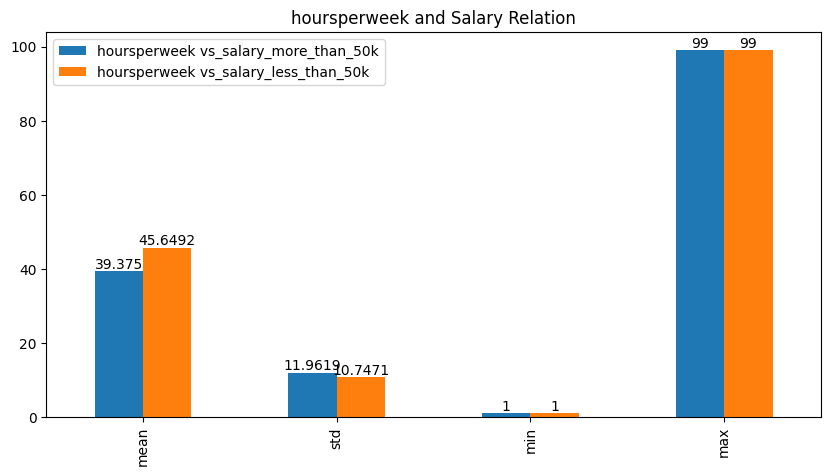

In [23]:
for i in num_features:
    a= pd.DataFrame()
    a[i +' vs_salary_more_than_50k'] = (data[data['Salary'] == ' <=50K'][['Salary',i ]].describe())[i]
    a[i +' vs_salary_less_than_50k'] = (data[data['Salary'] == ' >50K'][['Salary', i ]].describe())[i]
    a.drop(['count', '25%', '50%', '75%'],inplace=True)
    ax=a.plot.bar(title = i+ ' and Salary Relation',figsize=(10,5))
    for b in ax.containers:
        ax.bar_label(b,)


### Analyzing Relation by plotting Continuous features with the Target Feature

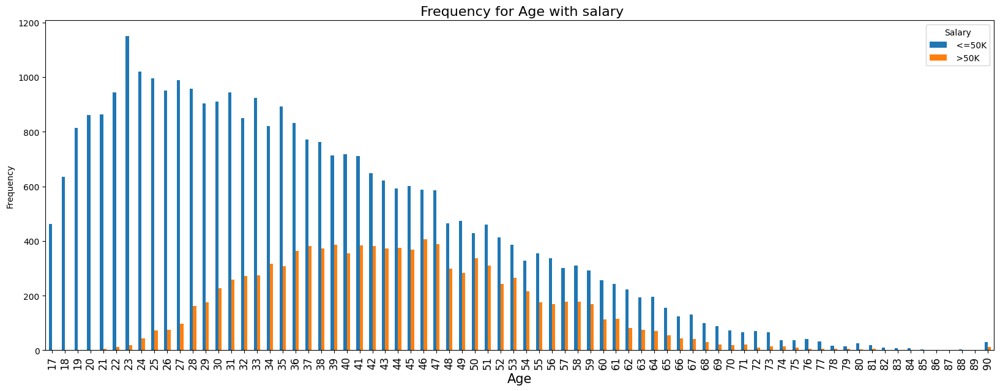

In [24]:
pd.crosstab(data.age,data.Salary).plot(kind="bar",figsize=(20,7))
plt.title(' Frequency for Age with salary', fontsize = 16)
plt.xticks(fontsize = 12)
plt.xlabel('Age', fontsize = 15)
plt.ylabel('Frequency')
plt.show()

- From above plot we see that the age between 19-43 years have more people who has less than 50k salary.
- The highest employees are in the age bracket of 22-33 who has less than 50k salary 
- This is because in this age students/graduates are looking for job opportunity and if they get job who paid less salary they will accept it. 
- After 65 Years of age they get less salary,because this age is of retirement

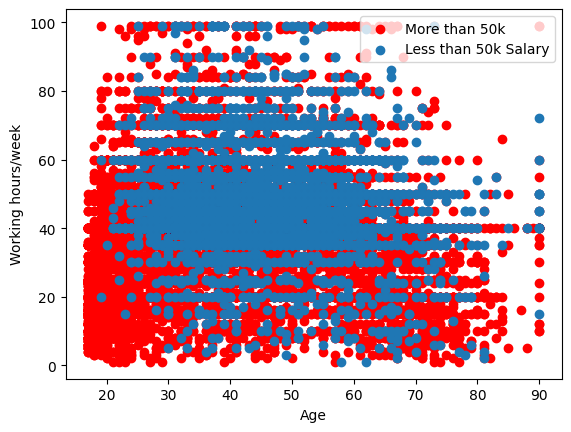

In [25]:
plt.scatter(x=data.age[data.Salary== ' <=50K'], y=data.hoursperweek[(data.Salary== ' <=50K')], c="red")
plt.scatter(x=data.age[data.Salary== ' >50K'], y=data.hoursperweek[(data.Salary== ' >50K')])
plt.legend(["More than 50k", "Less than 50k Salary"])
plt.xlabel("Age")
plt.ylabel("Working hours/week")
plt.show()

- In this more data concentrated between 30-60 age 
- Who has less salary they do more or relatively same working hrs/week 

### Now for categorical features

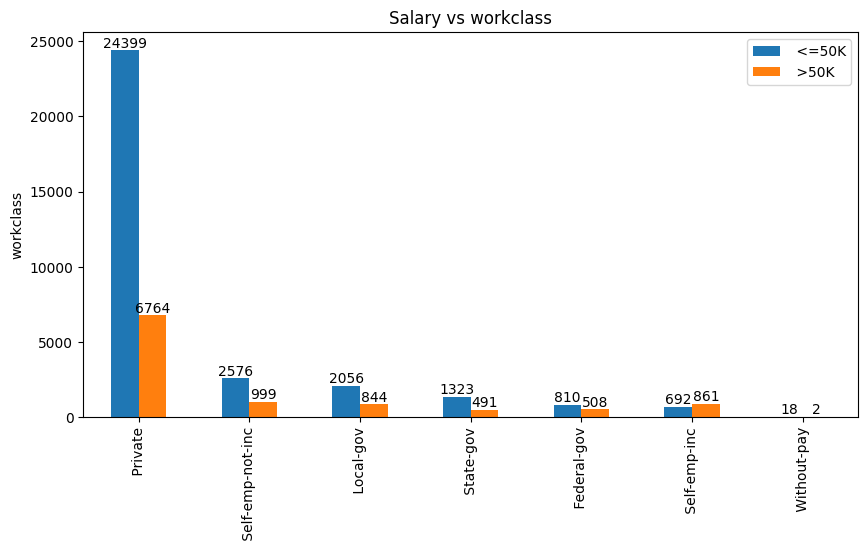

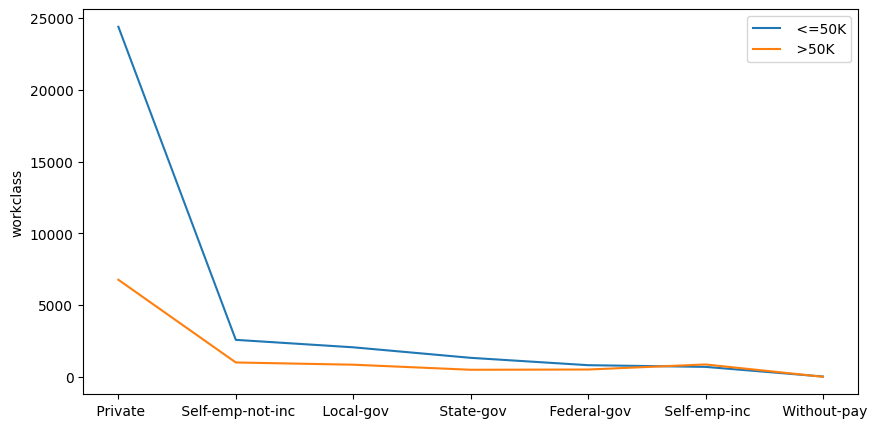

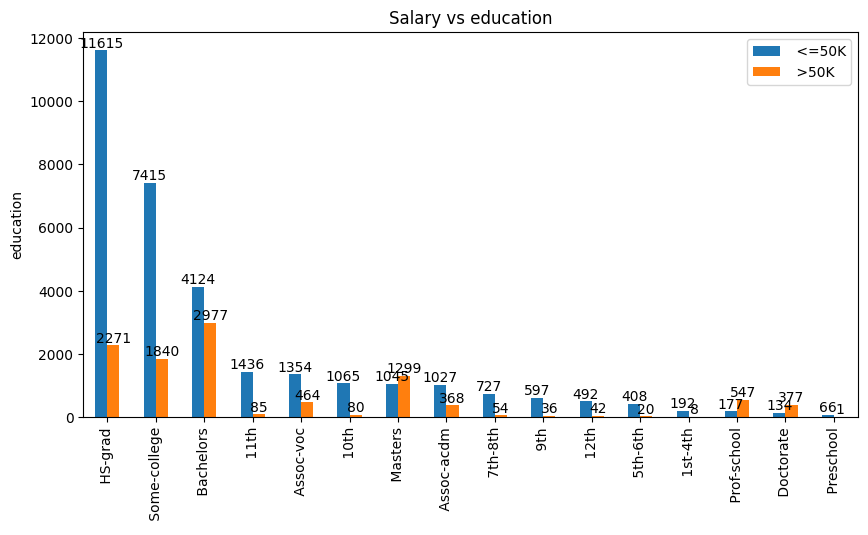

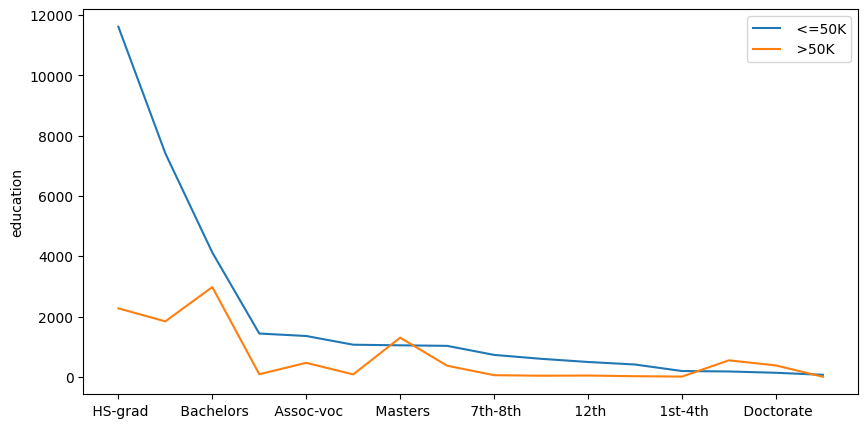

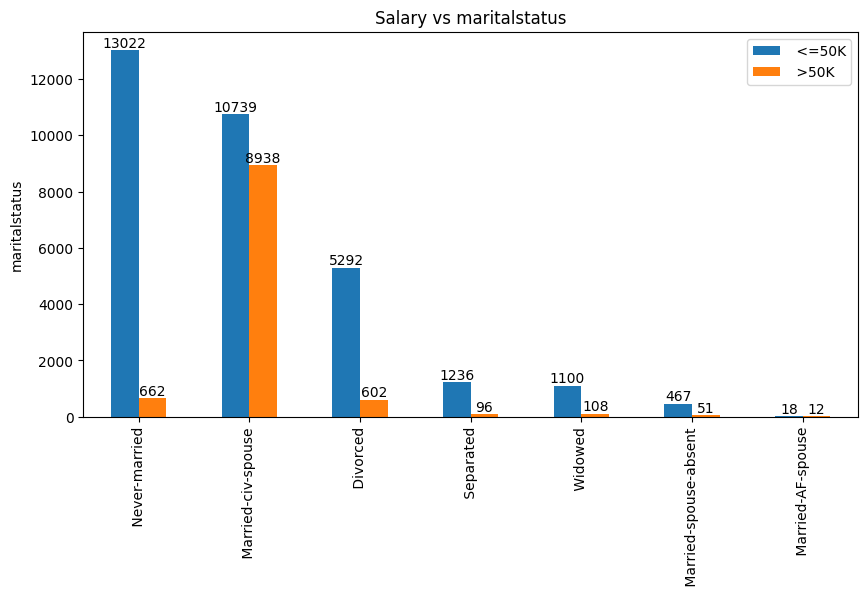

...

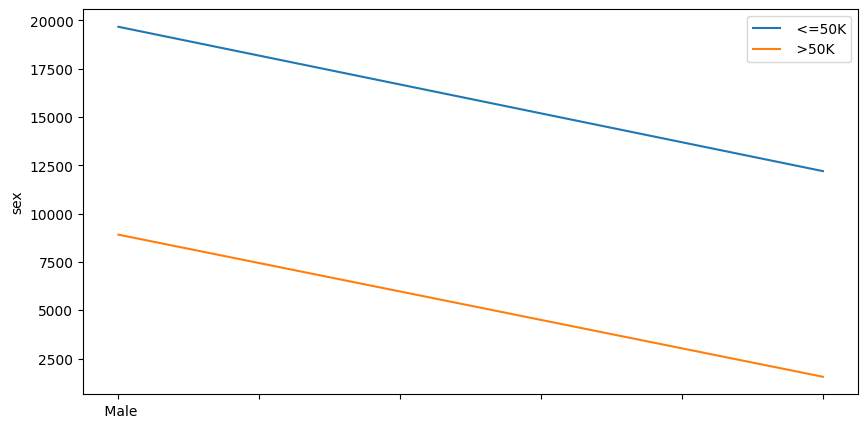

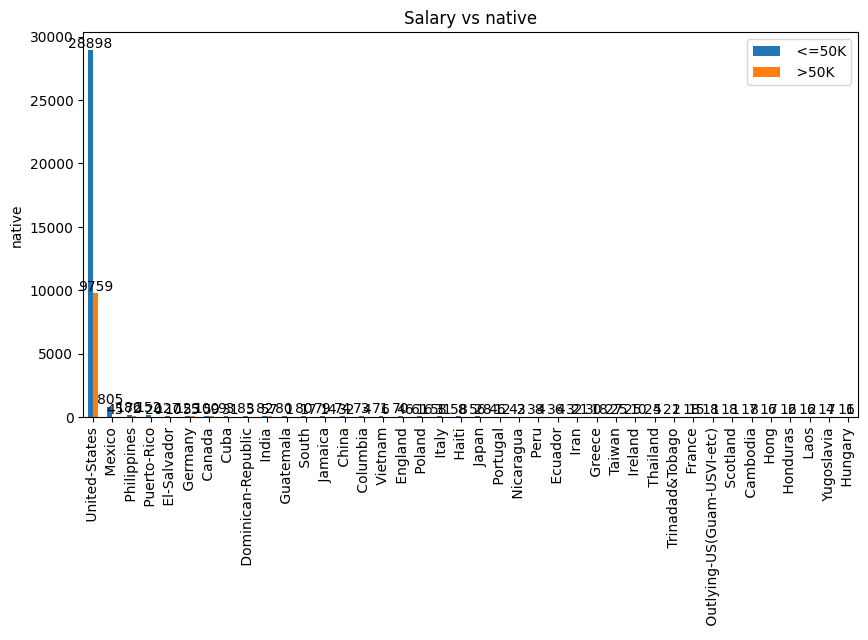

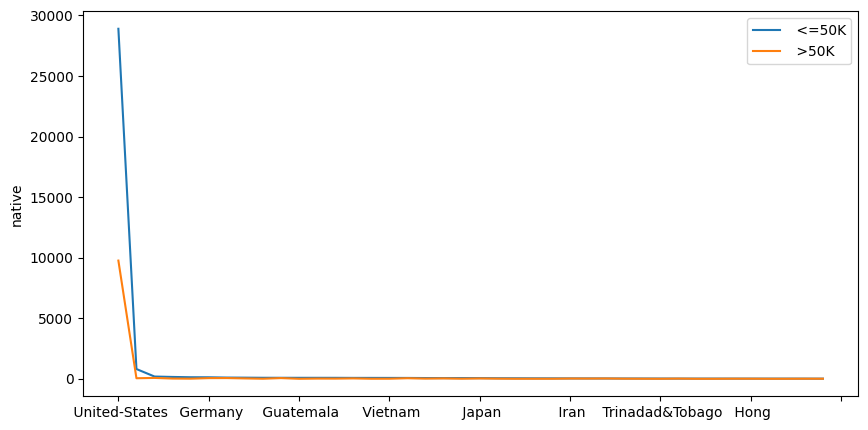

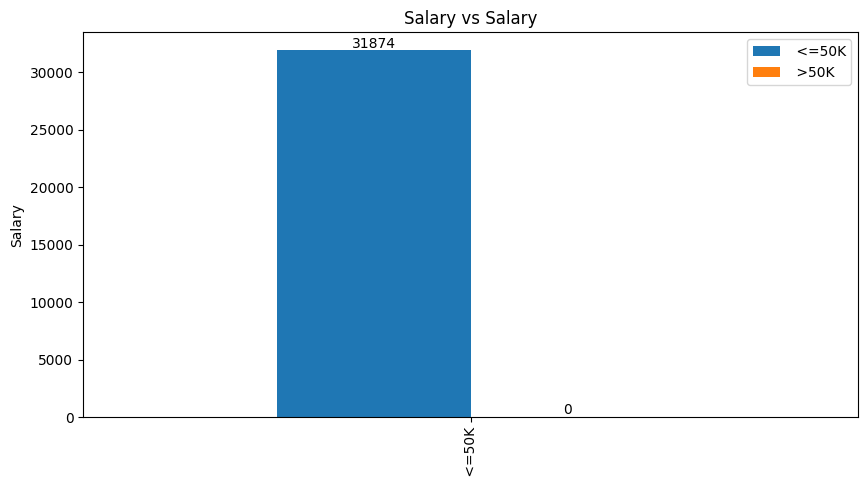

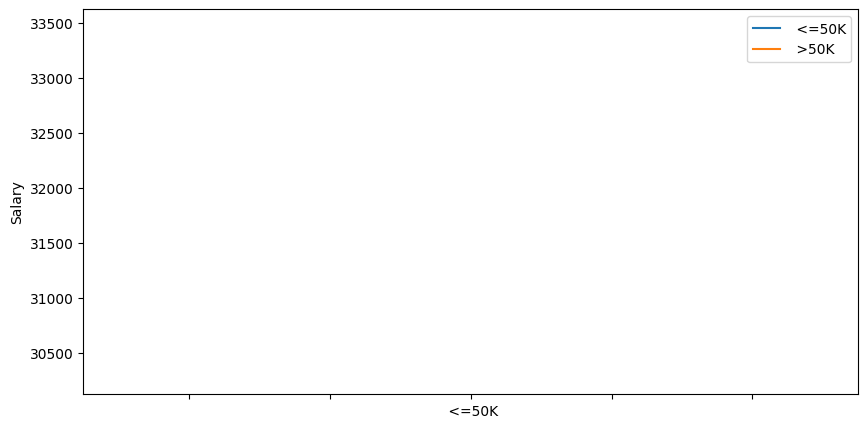

In [26]:
for i in cat_features:
    a=pd.DataFrame()
    a[' <=50K'] = data[data['Salary'] == ' <=50K'][i].value_counts()
    a[' >50K'] = data[data['Salary'] == ' >50K'][i].value_counts()
    ax=a.plot.bar(title='Salary vs ' + i,figsize=(10,5),ylabel=i,)
    a.plot(figsize=(10,5))
    plt.ylabel(i)
    for b in ax.containers:
        ax.bar_label(b,)
    

We see the insights of this plots:
- **Work class** = 25k+ peoples are employees of private company who has less than 50k salary.
- **Education** =More than 13000 employees comleted their education upto `HS-GRAD` who has less than 50k salary.The employees who completed Bachelors they have salary more 50k.So here we can say that the higher eduction=high salary.
- **Marital Status** = Nearly 14000 employees are never-marries(single) has less than 50k salary. And in the category of Married/spouse has more than 50k salary. From this results we can say that the singles are in young age(20-30) so they are not well-settled.
- **Occupation** = Highest no.of employees in 'Adm-clerical' job who has less salary. and on managerial level nearly 3000 employees has more salary.
- **Relationship**  = The people who are not live in family they earned less and the people who are 'Husband' earned more than evry other.
- **Race** = The "White" people earned more than any other race.
- **Sex** ='Males'are earn more than females.
- **Native** = US people earned more than others.

In [27]:
data

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,39,State-gov,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174.0,0.0,40.0,United-States,<=50K
1,50,Self-emp-not-inc,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0.0,0.0,13.0,United-States,<=50K
2,38,Private,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0.0,0.0,40.0,United-States,<=50K
3,53,Private,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0.0,0.0,40.0,United-States,<=50K
4,28,Private,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0.0,0.0,40.0,Cuba,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42339,33,Private,Bachelors,13,Never-married,Prof-specialty,Own-child,White,Male,0.0,0.0,40.0,United-States,<=50K
42340,39,Private,Bachelors,13,Divorced,Prof-specialty,Not-in-family,White,Female,0.0,0.0,36.0,United-States,<=50K
42341,38,Private,Bachelors,13,Married-civ-spouse,Prof-specialty,Husband,White,Male,0.0,0.0,50.0,United-States,<=50K
42342,44,Private,Bachelors,13,Divorced,Adm-clerical,Own-child,Asian-Pac-Islander,Male,5455.0,0.0,40.0,United-States,<=50K


In [28]:
train.head()

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,39,State-gov,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174.0,0.0,40.0,United-States,<=50K
1,50,Self-emp-not-inc,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0.0,0.0,13.0,United-States,<=50K
2,38,Private,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0.0,0.0,40.0,United-States,<=50K
3,53,Private,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0.0,0.0,40.0,United-States,<=50K
4,28,Private,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0.0,0.0,40.0,Cuba,<=50K


In [29]:
train.isna().sum()

age              0
workclass        0
education        0
educationno      0
maritalstatus    0
occupation       1
relationship     1
race             1
sex              1
capitalgain      1
capitalloss      1
hoursperweek     1
native           1
Salary           1
dtype: int64

In [30]:
train.dropna(axis=0,inplace=True)


In [31]:
df=train.copy()
df.head()

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,39,State-gov,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174.0,0.0,40.0,United-States,<=50K
1,50,Self-emp-not-inc,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0.0,0.0,13.0,United-States,<=50K
2,38,Private,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0.0,0.0,40.0,United-States,<=50K
3,53,Private,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0.0,0.0,40.0,United-States,<=50K
4,28,Private,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0.0,0.0,40.0,Cuba,<=50K


In [32]:
test.head()

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,25,Private,11th,7,Never-married,Machine-op-inspct,Own-child,Black,Male,0,0,40,United-States,<=50K
1,38,Private,HS-grad,9,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,50,United-States,<=50K
2,28,Local-gov,Assoc-acdm,12,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,40,United-States,>50K
3,44,Private,Some-college,10,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,7688,0,40,United-States,>50K
4,34,Private,10th,6,Never-married,Other-service,Not-in-family,White,Male,0,0,30,United-States,<=50K


In [33]:
test.isna().sum()

age              0
workclass        0
education        0
educationno      0
maritalstatus    0
occupation       0
relationship     0
race             0
sex              0
capitalgain      0
capitalloss      0
hoursperweek     0
native           0
Salary           0
dtype: int64

In [34]:
df1=test.copy()

In [35]:
df.columns

Index(['age', 'workclass', 'education', 'educationno', 'maritalstatus',
       'occupation', 'relationship', 'race', 'sex', 'capitalgain',
       'capitalloss', 'hoursperweek', 'native', 'Salary'],
      dtype='object')

### Label encoding Technique

#### For Train dataset

In [36]:

le=LabelEncoder()

df["workclass"]=le.fit_transform(df["workclass"])
df['education']=le.fit_transform(df['education'])
df['maritalstatus']= le.fit_transform(df['maritalstatus'])
df["sex"]=le.fit_transform(df["sex"])
df["race"]=le.fit_transform(df["race"])
df["occupation"]=le.fit_transform(df["occupation"])
df["relationship"]=le.fit_transform(df["relationship"])
df["native"]=le.fit_transform(df["native"])
df['Salary'] = np.where(df['Salary'].str.contains(" >50K"), 1, 0)

df.head()


,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,39,5,9,13,4,0,1,4,1,2174.0,0.0,40.0,37,0
1,50,4,9,13,2,3,0,4,1,0.0,0.0,13.0,37,0
2,38,2,11,9,0,5,1,4,1,0.0,0.0,40.0,37,0
3,53,2,1,7,2,5,0,2,1,0.0,0.0,40.0,37,0
4,28,2,9,13,2,9,5,2,0,0.0,0.0,40.0,4,0


### Test data

In [37]:

le=LabelEncoder()

df1["workclass"]=le.fit_transform(df1["workclass"])
df1['education']=le.fit_transform(df1['education'])
df1['maritalstatus']= le.fit_transform(df1['maritalstatus'])
df1["sex"]=le.fit_transform(df1["sex"])
df1["race"]=le.fit_transform(df1["race"])
df1["occupation"]=le.fit_transform(df1["occupation"])
df1["relationship"]=le.fit_transform(df1["relationship"])
df1["native"]=le.fit_transform(df1["native"])
df1['Salary'] = np.where(df1['Salary'].str.contains(" >50K"), 1, 0)

df1.head()


,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,25,2,1,7,4,6,3,2,1,0,0,40,37,0
1,38,2,11,9,2,4,0,4,1,0,0,50,37,0
2,28,1,7,12,2,10,0,4,1,0,0,40,37,1
3,44,2,15,10,2,6,0,2,1,7688,0,40,37,1
4,34,2,0,6,4,7,1,4,1,0,0,30,37,0


## Test Train Split With Imbalanced Dataset


In [38]:
df

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,39,5,9,13,4,0,1,4,1,2174.0,0.0,40.0,37,0
1,50,4,9,13,2,3,0,4,1,0.0,0.0,13.0,37,0
2,38,2,11,9,0,5,1,4,1,0.0,0.0,40.0,37,0
3,53,2,1,7,2,5,0,2,1,0.0,0.0,40.0,37,0
4,28,2,9,13,2,9,5,2,0,0.0,0.0,40.0,4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27278,30,2,11,9,4,2,3,4,1,0.0,1504.0,40.0,37,0
27279,32,2,11,9,0,0,3,4,0,0.0,0.0,40.0,37,0
27280,61,2,15,10,0,11,1,4,0,0.0,0.0,40.0,37,0
27281,21,2,3,2,2,7,2,4,1,0.0,0.0,40.0,8,0


In [39]:
x=df.drop(labels= 'Salary', axis = 1)
y=df.Salary
x

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native
0,39,5,9,13,4,0,1,4,1,2174.0,0.0,40.0,37
1,50,4,9,13,2,3,0,4,1,0.0,0.0,13.0,37
2,38,2,11,9,0,5,1,4,1,0.0,0.0,40.0,37
3,53,2,1,7,2,5,0,2,1,0.0,0.0,40.0,37
4,28,2,9,13,2,9,5,2,0,0.0,0.0,40.0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
27278,30,2,11,9,4,2,3,4,1,0.0,1504.0,40.0,37
27279,32,2,11,9,0,0,3,4,0,0.0,0.0,40.0,37
27280,61,2,15,10,0,11,1,4,0,0.0,0.0,40.0,37
27281,21,2,3,2,2,7,2,4,1,0.0,0.0,40.0,8


In [40]:
y

0        0
1        0
2        0
3        0
4        0
        ..
27278    0
27279    0
27280    0
27281    0
27282    0
Name: Salary, Length: 27283, dtype: int32

In [41]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3,random_state=1,stratify=y)
x_train


,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native
2826,38,2,12,14,2,3,0,4,1,0.0,0.0,60.0,37
23140,58,2,15,10,2,10,0,4,1,0.0,1902.0,40.0,37
21839,53,1,12,14,2,3,0,2,1,0.0,0.0,40.0,37
4964,67,2,15,10,2,11,0,4,1,0.0,1844.0,70.0,37
15781,32,2,9,13,2,11,0,4,1,0.0,0.0,42.0,37
...,...,...,...,...,...,...,...,...,...,...,...,...,...
788,59,2,11,9,2,7,0,4,1,0.0,0.0,40.0,37
22709,56,2,6,5,2,2,0,4,1,0.0,0.0,40.0,37
25956,32,2,4,3,2,6,5,1,0,0.0,0.0,40.0,23
19158,18,2,15,10,4,7,3,4,1,0.0,0.0,40.0,37


In [42]:
print("Shape of X_train: ",x_train.shape)
print("Shape of X_test: ", x_test.shape)
print("Shape of y_train: ",y_train.shape)
print("Shape of y_test",y_test.shape)

Shape of X_train:  (19098, 13)
Shape of X_test:  (8185, 13)
Shape of y_train:  (19098,)
Shape of y_test (8185,)


In [43]:
def g_score(clf, X_train, y_train, X_test, y_test, train=True):
    if train:
        pred = clf.predict(X_train)
        clf_report = pd.DataFrame(classification_report(y_train, pred, output_dict=True))
        print("Train Result:\n================================================")
        print(f"Accuracy Score: {accuracy_score(y_train, pred) * 100:.2f}%")
        print("_______________________________________________")
        print(f"CLASSIFICATION REPORT:\n{clf_report}")
        print("_______________________________________________")
        print(f"Confusion Matrix: \n {confusion_matrix(y_train, pred)}\n")
        #sn.heatmap(confusion_matrix(y_train, pred),annot=True)
    elif train==False:
        pred = clf.predict(X_test)
        clf_report = pd.DataFrame(classification_report(y_test, pred, output_dict=True))
        print("Test Result:\n================================================")        
        print(f"Accuracy Score: {accuracy_score(y_test, pred) * 100:.2f}%")
        print("_______________________________________________")
        print(f"CLASSIFICATION REPORT:\n{clf_report}")
        print("_______________________________________________")
        print(f"Confusion Matrix: \n {confusion_matrix(y_test, pred)}\n")
        sn.heatmap(confusion_matrix(y_test, pred),annot=True)

# Model Training

# Multinomial

Train Result:
Accuracy Score: 77.33%
_______________________________________________
CLASSIFICATION REPORT:
                      0            1  accuracy     macro avg  weighted avg
precision      0.786191     0.630006  0.773327      0.708099      0.747443
recall         0.959471     0.209160  0.773327      0.584315      0.773327
f1-score       0.864231     0.314055  0.773327      0.589143      0.727738
support    14360.000000  4738.000000  0.773327  19098.000000  19098.000000
_______________________________________________
Confusion Matrix: 
 [[13778   582]
 [ 3747   991]]

Test Result:
Accuracy Score: 77.23%
_______________________________________________
CLASSIFICATION REPORT:
                     0            1  accuracy    macro avg  weighted avg
precision     0.787149     0.616783  0.772266     0.701966      0.744875
recall        0.955476     0.217134  0.772266     0.586305      0.772266
f1-score      0.863183     0.321194  0.772266     0.592189      0.728695
support    6154.00

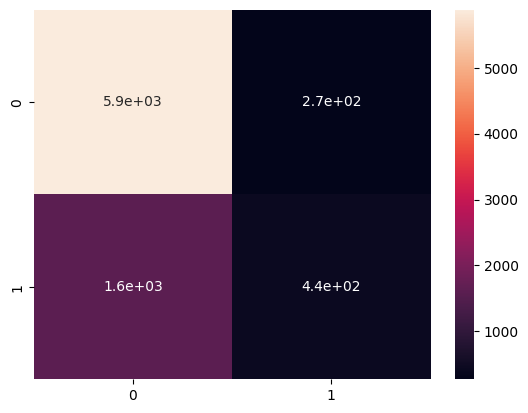

In [44]:
mb = MultinomialNB()
mb.fit(x_train,y_train)

g_score(mb, x_train, y_train, x_test,y_test, train=True)
g_score(mb, x_train, y_train, x_test,y_test, train=False)


## Gaussian NB

Train Result:
Accuracy Score: 79.57%
_______________________________________________
CLASSIFICATION REPORT:
                      0            1  accuracy     macro avg  weighted avg
precision      0.811065     0.682692  0.795685      0.746879      0.779217
recall         0.949443     0.329675  0.795685      0.639559      0.795685
f1-score       0.874816     0.444634  0.795685      0.659725      0.768092
support    14360.000000  4738.000000  0.795685  19098.000000  19098.000000
_______________________________________________
Confusion Matrix: 
 [[13634   726]
 [ 3176  1562]]

Test Result:
Accuracy Score: 79.36%
_______________________________________________
CLASSIFICATION REPORT:
                     0            1  accuracy    macro avg  weighted avg
precision     0.810890     0.670319  0.793647     0.740604      0.776009
recall        0.946214     0.331364  0.793647     0.638789      0.793647
f1-score      0.873341     0.443493  0.793647     0.658417      0.766680
support    6154.00

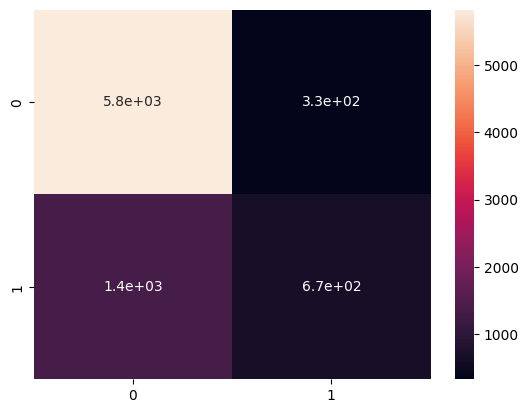

In [45]:
gb = GaussianNB()
gb.fit(x_train,y_train)

g_score(gb, x_train, y_train, x_test,y_test, train=True)
g_score(gb, x_train, y_train, x_test,y_test, train=False)

## Categorical NB

Train Result:
Accuracy Score: 85.67%
_______________________________________________
CLASSIFICATION REPORT:
                      0            1  accuracy     macro avg  weighted avg
precision      0.885207     0.749626  0.856739      0.817416      0.851571
recall         0.930084     0.634445  0.856739      0.782264      0.856739
f1-score       0.907090     0.687243  0.856739      0.797167      0.852549
support    14360.000000  4738.000000  0.856739  19098.000000  19098.000000
_______________________________________________
Confusion Matrix: 
 [[13356  1004]
 [ 1732  3006]]

Test Result:
Accuracy Score: 85.63%
_______________________________________________
CLASSIFICATION REPORT:
                     0            1  accuracy    macro avg  weighted avg
precision     0.880697     0.759563  0.856323     0.820130      0.850639
recall        0.935652     0.615953  0.856323     0.775802      0.856323
f1-score      0.907343     0.680261  0.856323     0.793802      0.850996
support    6154.00

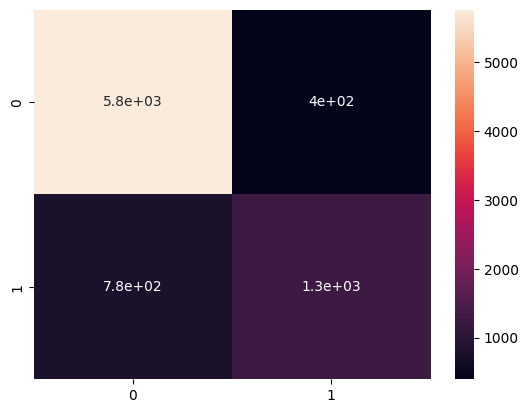

In [46]:
cb = CategoricalNB()
cb.fit(x_train,y_train)

g_score(cb, x_train, y_train, x_test,y_test, train=True)
g_score(cb, x_train, y_train, x_test,y_test, train=False)

- Due to imbalanced dataset our results are getting biased towards the majority. 
- The model is correctly classifying all the majority classes yet fails to classify the minority classes.
- Hence, we need to use some kind of oversampling techniques to balance the dataset.
- As Categorical Naive Bayes is scoring better result than other models we are going to use this model for final model building.

In [47]:
x_test1=df1.drop(labels= 'Salary', axis = 1)
y_test1=df1.Salary
x_test1

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native
0,25,2,1,7,4,6,3,2,1,0,0,40,37
1,38,2,11,9,2,4,0,4,1,0,0,50,37
2,28,1,7,12,2,10,0,4,1,0,0,40,37
3,44,2,15,10,2,6,0,2,1,7688,0,40,37
4,34,2,0,6,4,7,1,4,1,0,0,30,37
...,...,...,...,...,...,...,...,...,...,...,...,...,...
15055,33,2,9,13,4,9,3,4,1,0,0,40,37
15056,39,2,9,13,0,9,1,4,0,0,0,36,37
15057,38,2,9,13,2,9,0,4,1,0,0,50,37
15058,44,2,9,13,0,0,3,1,1,5455,0,40,37


Train Result:
Accuracy Score: 85.67%
_______________________________________________
CLASSIFICATION REPORT:
                      0            1  accuracy     macro avg  weighted avg
precision      0.885207     0.749626  0.856739      0.817416      0.851571
recall         0.930084     0.634445  0.856739      0.782264      0.856739
f1-score       0.907090     0.687243  0.856739      0.797167      0.852549
support    14360.000000  4738.000000  0.856739  19098.000000  19098.000000
_______________________________________________
Confusion Matrix: 
 [[13356  1004]
 [ 1732  3006]]

Test Result:
Accuracy Score: 85.46%
_______________________________________________
CLASSIFICATION REPORT:
                      0            1  accuracy     macro avg  weighted avg
precision      0.884399     0.741297  0.854648      0.812848      0.849241
recall         0.928697     0.627297  0.854648      0.777997      0.854648
f1-score       0.906007     0.679549  0.854648      0.792778      0.850370
support   

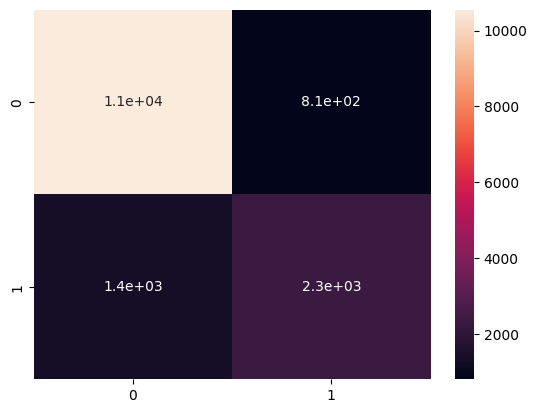

In [48]:
cb = CategoricalNB()
cb.fit(x_train,y_train)

g_score(cb, x_train, y_train, x_test1,y_test1, train=True)
g_score(cb, x_train, y_train, x_test1,y_test1, train=False)

# Handling imbalance data using SMOTE based techniques.

In [49]:
from collections import Counter

counter = Counter(y_train)
print('Before',counter)
# oversampling the train dataset using SMOTE
smt = SMOTE()
x_train_sm, y_train_sm = smt.fit_resample(x_train, y_train)

counter = Counter(y_train_sm)
print('After',counter)

Before Counter({0: 14360, 1: 4738})
After Counter({1: 14360, 0: 14360})


Train Result:
Accuracy Score: 58.44%
_______________________________________________
CLASSIFICATION REPORT:
                      0             1  accuracy     macro avg  weighted avg
precision      0.548247      0.837838  0.584436      0.693043      0.693043
recall         0.959471      0.209401  0.584436      0.584436      0.584436
f1-score       0.697779      0.335060  0.584436      0.516420      0.516420
support    14360.000000  14360.000000  0.584436  28720.000000  28720.000000
_______________________________________________
Confusion Matrix: 
 [[13778   582]
 [11353  3007]]

Test Result:
Accuracy Score: 77.23%
_______________________________________________
CLASSIFICATION REPORT:
                     0            1  accuracy    macro avg  weighted avg
precision     0.787149     0.616783  0.772266     0.701966      0.744875
recall        0.955476     0.217134  0.772266     0.586305      0.772266
f1-score      0.863183     0.321194  0.772266     0.592189      0.728695
support    61

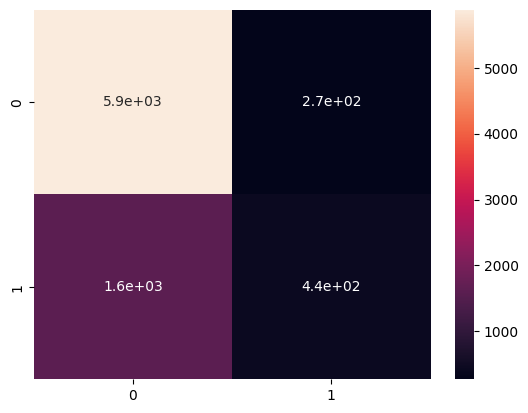

In [50]:
mb = MultinomialNB()
mb.fit(x_train_sm,y_train_sm)

g_score(mb, x_train_sm, y_train_sm, x_test,y_test, train=True)
g_score(mb, x_train_sm, y_train_sm, x_test,y_test, train=False)

Train Result:
Accuracy Score: 70.32%
_______________________________________________
CLASSIFICATION REPORT:
                      0             1  accuracy     macro avg  weighted avg
precision      0.639467      0.873991  0.703169      0.756729      0.756729
recall         0.931546      0.474791  0.703169      0.703169      0.703169
f1-score       0.758355      0.615315  0.703169      0.686835      0.686835
support    14360.000000  14360.000000  0.703169  28720.000000  28720.000000
_______________________________________________
Confusion Matrix: 
 [[13377   983]
 [ 7542  6818]]

Test Result:
Accuracy Score: 81.23%
_______________________________________________
CLASSIFICATION REPORT:
                     0            1  accuracy    macro avg  weighted avg
precision     0.837771     0.683469   0.81234     0.760620      0.799483
recall        0.930614     0.453964   0.81234     0.692289      0.812340
f1-score      0.881755     0.545562   0.81234     0.713659      0.798333
support    61

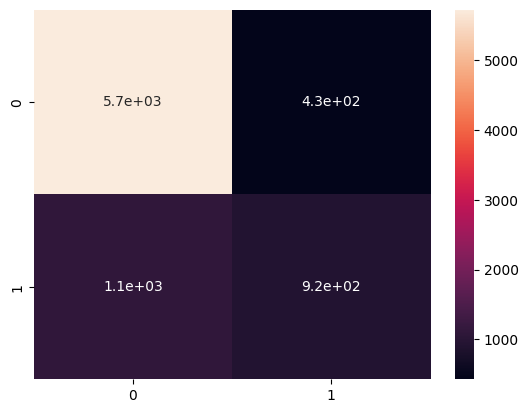

In [51]:
gb = GaussianNB()
gb.fit(x_train_sm,y_train_sm)

g_score(gb, x_train_sm, y_train_sm, x_test,y_test, train=True)
g_score(gb, x_train_sm, y_train_sm, x_test,y_test, train=False)

Train Result:
Accuracy Score: 84.37%
_______________________________________________
CLASSIFICATION REPORT:
                      0             1  accuracy     macro avg  weighted avg
precision      0.883152      0.811553  0.843663      0.847353      0.847353
recall         0.792131      0.895195  0.843663      0.843663      0.843663
f1-score       0.835169      0.851325  0.843663      0.843247      0.843247
support    14360.000000  14360.000000  0.843663  28720.000000  28720.000000
_______________________________________________
Confusion Matrix: 
 [[11375  2985]
 [ 1505 12855]]

Test Result:
Accuracy Score: 81.19%
_______________________________________________
CLASSIFICATION REPORT:
                     0            1  accuracy    macro avg  weighted avg
precision     0.938927     0.583817  0.811851     0.761372      0.850811
recall        0.801917     0.841950  0.811851     0.821934      0.811851
f1-score      0.865031     0.689516  0.811851     0.777273      0.821479
support    61

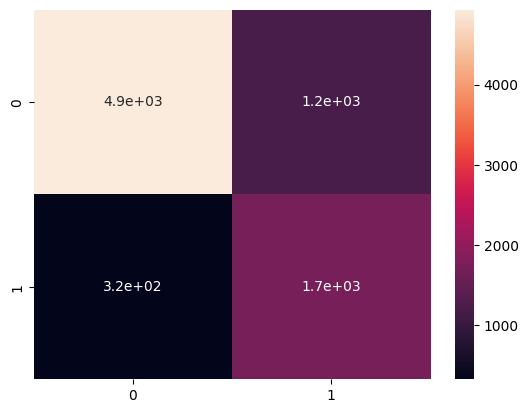

In [52]:
cb = CategoricalNB()
cb.fit(x_train_sm,y_train_sm)

g_score(cb, x_train_sm, y_train_sm, x_test,y_test, train=True)
g_score(cb, x_train_sm, y_train_sm, x_test,y_test, train=False)

Train Result:
Accuracy Score: 84.37%
_______________________________________________
CLASSIFICATION REPORT:
                      0             1  accuracy     macro avg  weighted avg
precision      0.883152      0.811553  0.843663      0.847353      0.847353
recall         0.792131      0.895195  0.843663      0.843663      0.843663
f1-score       0.835169      0.851325  0.843663      0.843247      0.843247
support    14360.000000  14360.000000  0.843663  28720.000000  28720.000000
_______________________________________________
Confusion Matrix: 
 [[11375  2985]
 [ 1505 12855]]

Test Result:
Accuracy Score: 81.24%
_______________________________________________
CLASSIFICATION REPORT:
                      0            1  accuracy     macro avg  weighted avg
precision      0.945506     0.579821  0.812417      0.762663      0.855663
recall         0.797271     0.858919  0.812417      0.828095      0.812417
f1-score       0.865084     0.692299  0.812417      0.778692      0.822634
suppo

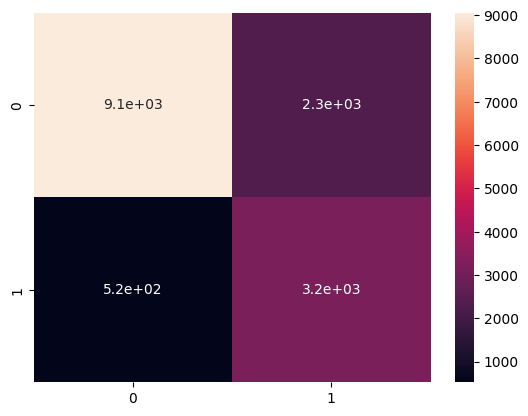

In [53]:
cb = CategoricalNB()
cb.fit(x_train_sm,y_train_sm)

g_score(cb, x_train_sm, y_train_sm, x_test1,y_test1, train=True)
g_score(cb, x_train_sm, y_train_sm, x_test1,y_test1, train=False)

Compare train and test accuracy
- The training-set accuracy score is 85% while the After SMOTE test-set accuracy to be 84.
- These two values are quite comparable. So, there is no sign of overfitting

[[9057 2303]
 [ 522 3178]]


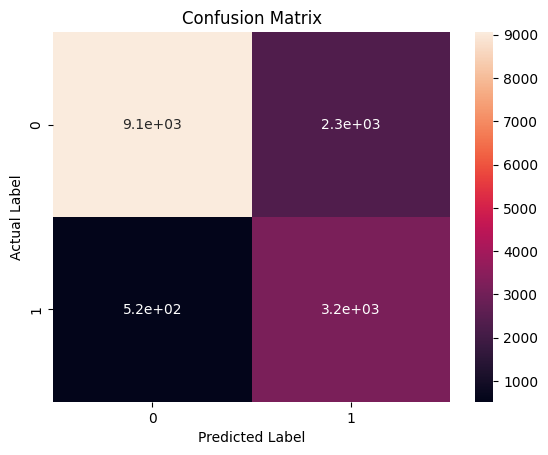

In [54]:
y_pred=cb.predict(x_test1)
cm=confusion_matrix(y_test1,y_pred)
print(cm)
sn.heatmap(cm,annot=True)
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.show()

In [55]:
y_pred_prob = cb.predict_proba(x_test1)[0:10]

y_pred_prob

array([[9.99993099e-01, 6.90085188e-06],
       [1.95087528e-01, 8.04912472e-01],
       [2.81606762e-02, 9.71839324e-01],
       [2.15883399e-03, 9.97841166e-01],
       [9.99957147e-01, 4.28529934e-05],
       [1.34138945e-04, 9.99865861e-01],
       [9.99967241e-01, 3.27586543e-05],
       [9.75514822e-01, 2.44851780e-02],
       [9.37512597e-02, 9.06248740e-01],
       [3.32202463e-02, 9.66779754e-01]])

In [56]:
# store the probabilities in dataframe

y_pred_prob_df = pd.DataFrame(data=y_pred_prob, columns=['Prob of - Salary <=50k (0)', 'Prob of - Salary >50k (1)'])

y_pred_prob_df



,Prob of - Salary <=50k (0),Prob of - Salary >50k (1)
0,0.999993,0.000007
1,0.195088,0.804912
2,0.028161,0.971839
3,0.002159,0.997841
4,0.999957,0.000043
5,0.000134,0.999866
6,0.999967,0.000033
7,0.975515,0.024485
8,0.093751,0.906249
9,0.033220,0.966780


In [ ]:
# Creating the dataframe with the actual subscription flag and the predicted probabilities
y_test_pred_final = pd.DataFrame({'Sub':y_test.values,'Sub_prob':y_test_pred})
y_test_pred_final['Cust_id'] = y_test.index
y_test_pred_final.head(10)